# <center> Раздел 2. Модуль 5. Визуализация данных

In [13]:
import pandas as pd
#используем объединенный датасет о заболеваемости и вакцинации
covid_df = pd.read_csv('data/covid_df.csv') 
covid_df['date'] = pd.to_datetime(covid_df['date'])
covid_df.head()

,Unnamed: 0,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_confirmed1,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recover_rate
0,0,2020-02-24,Afghanistan,1.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
1,1,2020-02-25,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
2,2,2020-02-26,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
3,3,2020-02-27,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
4,4,2020-02-28,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0


## <center> Графические возможности библиотеки plotly
    

Библиотека plotly является сравнительно новым коммерческим продуктом с бесплатной версией, который создавался специально для Data Science, в отличие от старенького matplotlib, который изначально разрабатывался для научных вычислений. 
Библиотека позволяет строить интерактивные графики, которые можно приближать, отдалять, а также просматривать значения на графике в реальном времени. К тому же в библиотеке собрано огромнейшее количество красочных методов визуализации, приятный дизайн и несколько способов работы с ней.
С помощью plotly можно делать сложные визуализации с элементами управления. Например, строить интерактивную 3D-визуализацию, карту мира и многое другое. 


In [17]:
#!pip install plotly

Plotly позволяет строить графики в нескольких режимах. Мы рассмотрим самый новый и подающий надежды - экспресс режим, он имеет чуть меньшую функциональность, чем полный режим plotly, но нам его хватит с головой. Для работы в нем предназначен модуль plotly.express.


In [2]:
import plotly
import plotly.express as px
plotly.__version__

'5.18.0'

Рассмотрим процесс визуализации на примере. Посмотрим, как выглядит линейный график, построенный с помощью метода line() из модуля express. В документации к методу приведено пару десятков параметров этого метода (они схожи с параметрами других методов), приведем основные из них:
* data_frame - ну собственно DataFrame, по которому строим график
* x - признак по оси абсцисс
* y - признак по оси ординат
* height - высота графика
* width - ширина графика
* title - название графика

Построим на рост зафиксированного числа случаев заражения (confirmed), смертей (deaths), выздоровлений(recovered) и активных случаев(active) за все время. Для этого просуммируем статистику по дням и передадим полученный DataFrame в метод line().


In [19]:
dw=covid_df.groupby('date', as_index=False).sum()
dw.head(2)

,date,Unnamed: 0,country,confirmed,deaths,recovered,active,daily_confirmed,daily_confirmed1,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recover_rate
0,2020-01-22,487777,ChinaHong KongJapanKiribatiMacauSouth KoreaTai...,557.0,17.0,30.0,510.0,0.0,-8005702.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,3.107861,55.118830
1,2020-01-23,835488,AustraliaBrazilChinaColombiaHong KongJapanKiri...,1097.0,34.0,60.0,1003.0,537.0,-2361782.0,17.0,30.0,0.0,0.0,0.0,0.0,0.0,0.0,0,3.142329,55.360444


In [21]:
dw.columns

Index(['date', 'Unnamed: 0', 'country', 'confirmed', 'deaths', 'recovered',
       'active', 'daily_confirmed', 'daily_confirmed1', 'daily_deaths',
       'daily_recovered', 'total_vaccinations', 'people_vaccinated',
       'people_vaccinated_per_hundred', 'people_fully_vaccinated',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations', 'vaccines',
       'death_rate', 'recover_rate'],
      dtype='object')

In [16]:
dq=covid_df.groupby('date', as_index=True).sum()
dq.head(2)

,Unnamed: 0,country,confirmed,deaths,recovered,active,daily_confirmed,daily_confirmed1,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recover_rate
date,,,,,,,,,,,,,,,,,,,
2020-01-22,487777,ChinaHong KongJapanKiribatiMacauSouth KoreaTai...,557.0,17.0,30.0,510.0,0.0,-8005702.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,3.107861,55.118830
2020-01-23,835488,AustraliaBrazilChinaColombiaHong KongJapanKiri...,1097.0,34.0,60.0,1003.0,537.0,-2361782.0,17.0,30.0,0.0,0.0,0.0,0.0,0.0,0.0,0,3.142329,55.360444


In [22]:
type(dq)

pandas.core.frame.DataFrame

In [17]:
dq.index

DatetimeIndex(['2020-01-22', '2020-01-23', '2020-01-24', '2020-01-25',
               '2020-01-26', '2020-01-27', '2020-01-28', '2020-01-29',
               '2020-01-30', '2020-01-31',
               ...
               '2021-05-20', '2021-05-21', '2021-05-22', '2021-05-23',
               '2021-05-24', '2021-05-25', '2021-05-26', '2021-05-27',
               '2021-05-28', '2021-05-29'],
              dtype='datetime64[ns]', name='date', length=494, freq=None)

In [18]:
dq.columns

Index(['Unnamed: 0', 'country', 'confirmed', 'deaths', 'recovered', 'active',
       'daily_confirmed', 'daily_confirmed1', 'daily_deaths',
       'daily_recovered', 'total_vaccinations', 'people_vaccinated',
       'people_vaccinated_per_hundred', 'people_fully_vaccinated',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations', 'vaccines',
       'death_rate', 'recover_rate'],
      dtype='object')

In [19]:
line_data = covid_df.groupby('date', as_index=False).sum()
fig = px.line(
    data_frame=line_data, #датафрейм
    x='date', #ось абсцисс
    y=['confirmed', 'recovered', 'deaths', 'active'], #ось ординат
    height=500, #высота
    width=1000, #ширина
    title='Confirmed, Recovered, Deaths, Active cases over Time' #заголовок
)
fig.show()

Еще пример: построим столбчатую диаграмму показывающую топ 10 стран по среднему проценту выздоравливающих пациентов (recover_rate). Для этого используем метод bar() модуля express. Добавим пару параметров:
* color - группирующий признак, в соответствии с которым будет различная раскраска для столбцов диаграммы
* text - текст, который будет подписан на столбцах диаграммы
* orientation - ориентация графика ('v' - вертикальная, 'h' - горизонтальная)


In [20]:
#считаем средний процент выздоровлений для каждой страны
bar_data = covid_df.groupby(
    by='country',
    as_index=False
)[['recover_rate']].mean().nlargest(10, columns=['recover_rate'])

#строим график
fig = px.bar(
    data_frame=bar_data, #датафрейм
    x="country", #ось x
    y="recover_rate", #ось y
    color='country', #расцветка в зависимости от страны
    text = 'recover_rate', #текст на столбцах
    orientation='v', #ориентация графика
    height=500, #высота
    width=1000, #ширина
    title='Top 10 Countries for Recovery Rate' #заголовок
)

#отображаем его
fig.show()

/home/elena/.local/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



А теперь построим что-нибудь новенькое, специфичное для библиотеки plotly. Например график treemap() (древесная или иерархическая диаграмма). Такой график используется для исследования показателя, когда число возможных категорий велико (например, число стран в таблице covid_df).

Основные параметры метода treemap():
* data_frame - ну собственно DataFrame, по которому строим график
* path - категориальные признаки (их может быть несколько), в разрезе которых строится диаграмма
* values - показатель, по которому рассчитываются размеры прямоугольников

Построим иерархическую диаграмму для среднего ежедневного показателя выздоровевших пациентов (daily_recovered) во всех странах. 


In [21]:
#считаем среднюю ежедневную заболеваемость по странам
treemap_data = covid_df.groupby(
    by='country',
    as_index=False
)[['daily_recovered']].mean()

#строим график
fig = px.treemap(
    data_frame=treemap_data, #датафрейм
    path=['country'], #кат. признак, для которого строится график
    values='daily_recovered', #параметр, который сравнивается
    height=500, #высота
    width=700, #ширина
    title='Daily Recovered Cases by Country' #заголовок
)

#отображаем его
fig.show()

С помощью plotly.express можно строить даже анимированные графики. Например, для нашей задачи отлично подойдет график под названием choropleth() (тепловая картограмма) - это тепловая карта, которая строится на географической карте мира. Чтобы показать, как изменяется значение показателя на карте во времени можно добавить анимацию в график.
Отличительные параметры метода choropleth():
* data_frame - ну вы поняли
* locations - название столбца из которого берутся локации (столбец со странами или регионами)
* locationmode - режим геопривязки, определяет как будет производиться сопоставление данных с картой в plotly (возможно сопоставление по название страны - "country_name" - или по её трёхзначному шифру согласно по ее международному стандарту "ISO-3")
* range_color - диапазон изменения цвета
* animation_frame - анимирующий признак, изменяя который мы получаем анимацию
* color_continuous_scale - цветовая палитра



In [22]:
choropleth_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 86785 entries, 39389 to 38497
Data columns (total 20 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Unnamed: 0                           86785 non-null  int64  
 1   date                                 86785 non-null  string 
 2   country                              86785 non-null  object 
 3   confirmed                            86785 non-null  float64
 4   deaths                               86785 non-null  float64
 5   recovered                            86785 non-null  float64
 6   active                               86785 non-null  float64
 7   daily_confirmed                      86564 non-null  float64
 8   daily_confirmed1                     86784 non-null  float64
 9   daily_deaths                         86564 non-null  float64
 10  daily_recovered                      86564 non-null  float64
 11  total_vaccinations           

In [23]:
#преобразуем даты в строки
choropleth_data = covid_df.sort_values(by='date')
choropleth_data['date'] = choropleth_data['date'].astype('string')

#строим график
fig = px.choropleth(
    data_frame=choropleth_data, #датафрейм
    locations="country", #столбец с локациями
    locationmode = "country names", #режим сопоставления локаций с базой plotly
    color="confirmed", #от чего зависит цвет
    animation_frame="date", #анимационный ползунок
    range_color=[0, 30e6],
    title='Global Spread of COVID-19', #заголовок
    width=800, #ширина
    height=500, #высота
    color_continuous_scale='Reds' #палитра цветов
)

#отображаем его
fig.show()

/home/elena/.local/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



Построим 3D-диаграмму рассеяния, которая покажет, как число ежедневно обнаруживаемых случаев и число ежедневных смертей влияют на желание людей вакцинироваться. Для того, чтобы нам было проще рассматривать диаграмму (точки будут более сгруппированы) построим ее в логарифмическом масштабе по осям абсцисс и ординат.
Для построения такой диаграммы используем метод scatter_3d(). Добавим парочку параметров:
* z - параметр по оси аппликат
* log_x - установка логарифмического масштаба по оси x 
* log_y - установка логарифмического масштаба по оси y

Для того, чтобы не захламить график, будем строить зависимость только в нескольких странах: США, России, Великобритании, Бразилии и Франции. Наблюдения для каждой страны окрасим разными цветами.


In [24]:
#фильтруем таблицу по странам
countries=['United States', 'Russia', 'United Kingdom', 'Brazil', 'France']
scatter_data = covid_df[covid_df['country'].isin(countries)]

#строим график
fig = px.scatter_3d(
    data_frame=scatter_data, #датафрейм 
    x = 'daily_confirmed', #ось абсцисс
    y = 'daily_deaths', #ось ординат
    z = 'daily_vaccinations', #ось аппликат
    color='country', #расцветка в зависимости от страны
    log_x=True, 
    log_y=True,
    width=1000,
    height=700
)

#отображаем его
fig.show()
fig.write_html("data/scatter_3d.html")


/home/elena/.local/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [25]:
choropleth_data.head()

,Unnamed: 0,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_confirmed1,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recover_rate
39389,39389,2020-01-22,Japan,2.0,0.0,0.0,2.0,NaN,-48372.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.00000
33822,33822,2020-01-22,Hong Kong,0.0,0.0,0.0,0.0,NaN,-236952.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16251,16251,2020-01-22,China,547.0,17.0,28.0,502.0,NaN,-1369050.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.107861,5.11883
77965,77965,2020-01-22,Thailand,4.0,0.0,2.0,2.0,NaN,-505.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,50.00000
76636,76636,2020-01-22,Taiwan,1.0,0.0,0.0,1.0,NaN,-24439.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.00000


In [28]:
choropleth_data = covid_df.sort_values(by='date')
choropleth_data['date'] = choropleth_data['date'].astype('string')
fig = px.choropleth(
    data_frame=choropleth_data, #DataFrame
    locations="country", #столбец с локациями
    locationmode = "country names", #режим сопоставления локаций с базой Plotly
    color='active', #"total_vaccinations", #от чего зависит цвет
    hover_name="country", #группирующая переменная
    animation_frame="date", #анимационный бегунок
    color_continuous_scale='Reds', #палитра цветов
    range_color=[0, 600e6] #диапазон цвета
)

fig.show()

/home/elena/.local/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [30]:
churn_data = pd.read_csv('data/churn.zip')
churn_data.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [31]:
df=churn_data.groupby(by='Exited')['Exited'].count()
df

Exited
0    7963
1    2037
Name: Exited, dtype: int64

In [35]:
df.index

Index([0, 1], dtype='int64', name='Exited')

<Axes: xlabel='Exited'>

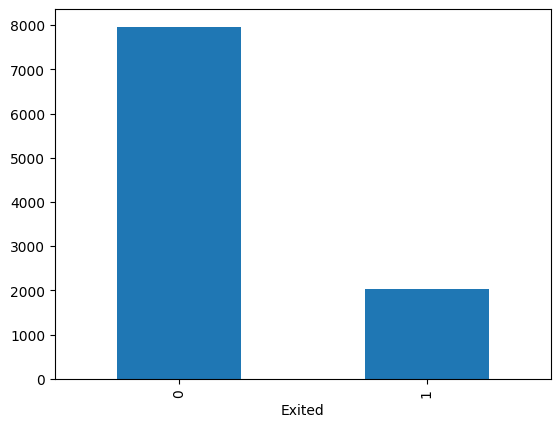

In [32]:
df.plot(
    kind='bar',
    
)

In [34]:
import matplotlib.pyplot as plt
%matplotlib inline

Text(0.5, 1.0, 'title')

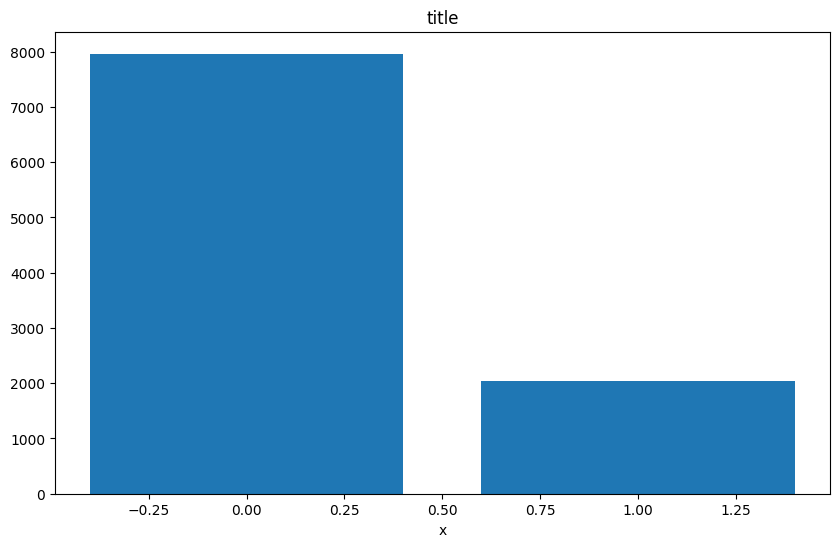

In [66]:
fig = plt.figure(figsize=(10, 6))
ax= plt.bar(
    x = df.index,
    height= df
)
plt.xlabel('x')
plt.title('title')

In [67]:
type(ax)
ax.

matplotlib.container.BarContainer

In [44]:
import seaborn as sns

Text(0.5, 0, 'x')

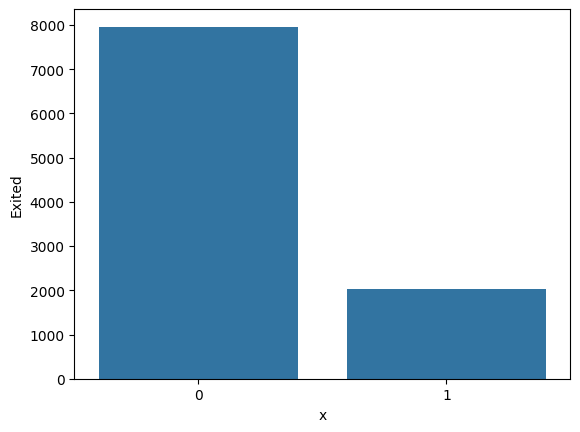

In [71]:
ax=sns.barplot(
    data=df
)
ax.set_xlabel('x')

In [70]:
type(ax)

matplotlib.axes._axes.Axes

In [101]:
#plt.xlabel('q')
ax = px.bar(
    df,
    text= df,
    labels={'index':'a', 'value':'y'}
)
ax.select_xaxes='l'
#plt.title('l')
ax.show()

In [93]:
px.bar?

Signature:
px.bar(
    data_frame=None,
    x=None,
    y=None,
    color=None,
    pattern_shape=None,
    facet_row=None,
    facet_col=None,
    facet_col_wrap=0,
    facet_row_spacing=None,
    facet_col_spacing=None,
    hover_name=None,
    hover_data=None,
    custom_data=None,
    text=None,
    base=None,
    error_x=None,
    error_x_minus=None,
    error_y=None,
    error_y_minus=None,
    animation_frame=None,
    animation_group=None,
    category_orders=None,
    labels=None,
    color_discrete_sequence=None,
    color_discrete_map=None,
    color_continuous_scale=None,
    pattern_shape_sequence=None,
    pattern_shape_map=None,
    range_color=None,
    color_continuous_midpoint=None,
    opacity=None,
    orientation=None,
    barmode='relative',
    log_x=False,
    log_y=False,
    range_x=None,
    range_y=None,
    text_auto=False,
    title=None,
    template=None,
    width=None,
    height=None,
) -> plotly.graph_objs._figure.Figure
Docstring:
    In a bar plot,

In [92]:
ax.*title*

SyntaxError: invalid syntax (3623105075.py, line 1)

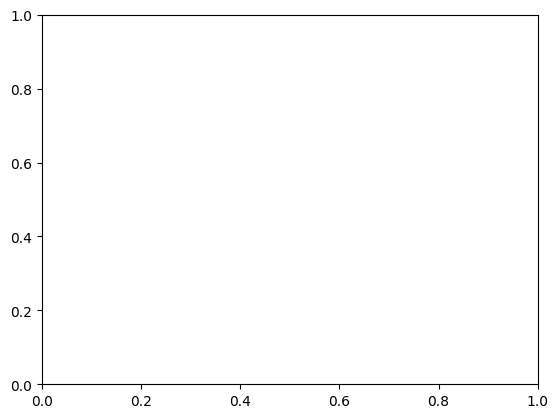

In [84]:

ca=plt.gca()

In [85]:
ca.title

Text(0.5, 1.0, '')